In [1]:
using Samplers
using PlotlyJS
using DataFrames

N.B. It is suggested that the critical temperature is approximately 4.5. Also, you can drag the camera around and zoom in/ out
on Plotly; rotate with LMB, translate with RMB.

# Metropolis Simulations

In [2]:
# Generate a dataframe that can be quickly passed into the Plotly backend.
function gen_imdf(nspins=25, beta=2.0, nsweeps::Int=1000, algorithm::Symbol=:Metropolis)
    # Create lattice
    im = Periodic_3d(nspins, beta)

    # Sample
    if algorithm == :Metropolis
        Metropolis!(im, nsweeps)
    else
        Wolff!(im, nsweeps)
    end


    # Generate DF
    im_df = DataFrame((i=Int64[], j=Int64[], k=Int64[], spin=Int8[]));
    ct = 1
    for x in CartesianIndices(im.state)
        insert!(im_df, ct, (x[1], x[2], x[3], im.state[x]))
        ct += 1
    end

    return im_df
end

gen_imdf (generic function with 5 methods)

In [7]:
# Takes about 5 minutes; much shorter if you cut down to 1000 sweeps
im_df = gen_imdf(40, 2.20, 10000, :Metropolis)

println("Plotting...")
plot(
    im_df,
    x=:i, y=:j, z=:k, #color=:spin,
    type="scatter3d", mode="markers",
    marker=attr(
        color=:spin,
        colorscale="Greys",
    )
)

In [ ]:
# Takes about 5 minutes again
im_df = gen_imdf(40, 4.40, 10000, :Metropolis)

println("Plotting...")
plot(
    im_df,
    x=:i, y=:j, z=:k, #color=:spin,
    type="scatter3d", mode="markers",
    marker=attr(
        color=:spin,
        colorscale="Greys",
    )
)

In [ ]:
# Takes about 5 minutes; much shorter if you cut down to 1000 sweeps
im_df = gen_imdf(40, 5.0, 10000, :Metropolis)

println("Plotting...")
plot(
    im_df,
    x=:i, y=:j, z=:k, #color=:spin,
    type="scatter3d", mode="markers",
    marker=attr(
        color=:spin,
        colorscale="Greys",
    )
)

# Wolff simulations

Plotting...


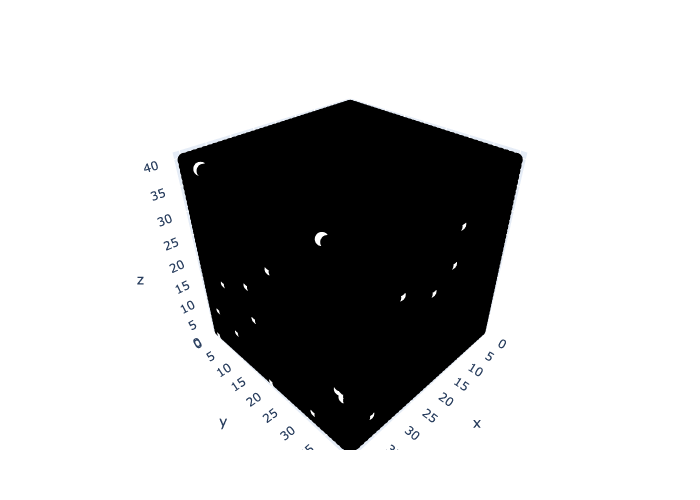

In [3]:
im_df = gen_imdf(40, 2.20, 1000, :Wolff)

println("Plotting...")
plot(
    im_df,
    x=:i, y=:j, z=:k, #color=:spin,
    type="scatter3d", mode="markers",
    marker=attr(
        color=:spin,
        colorscale="Greys",
    )
)

Plotting...


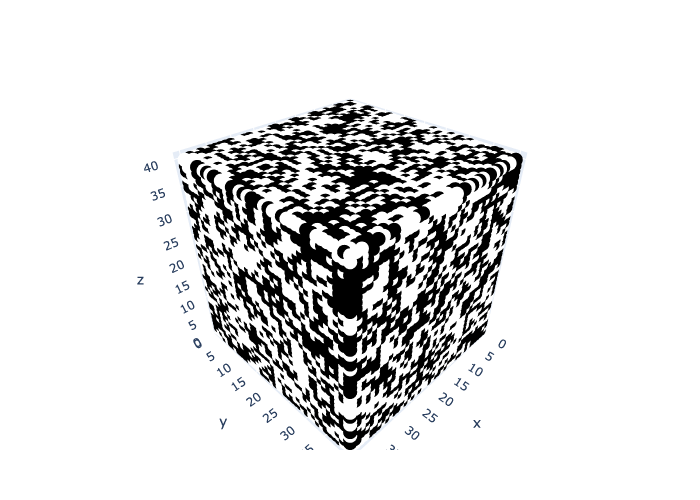

In [6]:
im_df = gen_imdf(40, 4.40, 1000, :Wolff)

println("Plotting...")
plot(
    im_df,
    x=:i, y=:j, z=:k, #color=:spin,
    type="scatter3d", mode="markers",
    marker=attr(
        color=:spin,
        colorscale="Greys",
    )
)

Plotting...


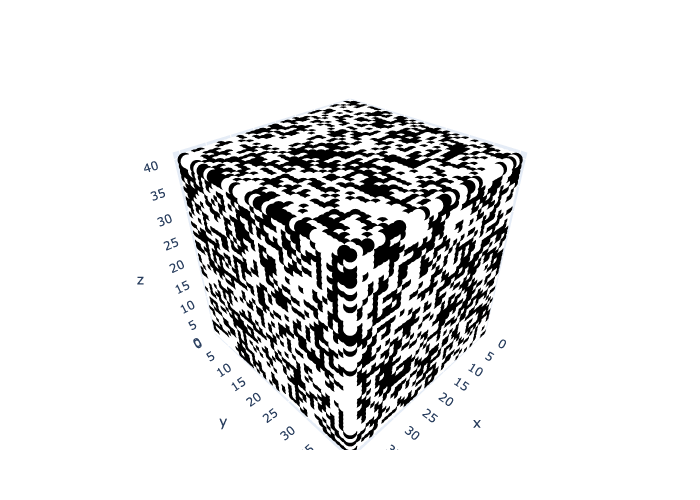

In [5]:
im_df = gen_imdf(40, 5.0, 1000, :Wolff)

println("Plotting...")
plot(
    im_df,
    x=:i, y=:j, z=:k, #color=:spin,
    type="scatter3d", mode="markers",
    marker=attr(
        color=:spin,
        colorscale="Greys",
    )
)